In [1]:
import numpy as np
import pandas as pd
# pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


from bs4 import BeautifulSoup
import requests
import json
from pandas import json_normalize

from geopy.geocoders import Nominatim
import folium

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

from sklearn.cluster import KMeans

import string

# from google.colab import drive
# drive.mount('/content/drive')

# Scrapping Kecamatan & Kelurahan at Jakarta Selatan

In [2]:
url = 'https://id.wikipedia.org/wiki/Daftar_kecamatan_dan_kelurahan_di_Kota_Administrasi_Jakarta_Selatan'
raw = requests.get(url).text

soup = BeautifulSoup(raw, 'html5lib')
len(soup.find('table'))

4

In [78]:
#table
table = soup.find_all('table')[0].tbody.find_all('td')
# table

In [4]:
len(table)

40

In [5]:
# #############
# # Kecamatan #
# #############
# kecamatan = []
# for t in np.arange(1,len(table),4):
#   kecamatan.append(table[t].text)

# #############
# # Kelurahan #
# #############
# kelurahan = []
# for t in np.arange(3,len(table),4):
#   kelurahan.append(table[t].text.split('\n')[1:-2])

# ########################
# # Kelurahan & Kecamtan #
# ########################
# for kel in range(len(kelurahan)):
#   print(kelurahan[kel])
#   print()
#   for k in range(len(kelurahan[kel])):
#     print(kelurahan[kel][k])
#     print(kecamatan[kel])
#   print()


In [6]:

kecamatan = []
kelurahan = []

district = []
sub_district = []

for t in np.arange(1,len(table),4):
  kecamatan.append(table[t].text)

for t in np.arange(3,len(table),4):
  kelurahan.append(table[t].text.split('\n')[1:-2])

for kel in range(len(kelurahan)):
  for k in range(len(kelurahan[kel])):
    sub_district.append(kelurahan[kel][k])
    district.append(kecamatan[kel])


In [7]:
df_jaksel = pd.DataFrame({'District':district, 'Regency':sub_district})
df_jaksel

,District,Regency
0,Cilandak,Cilandak Barat
1,Cilandak,Cipete Selatan
2,Cilandak,Gandaria Selatan
3,Cilandak,Lebak Bulus
4,Cilandak,Pondok Labu
...,...,...
60,Tebet,Manggarai Selatan
61,Tebet,Manggarai
62,Tebet,Menteng Dalam
63,Tebet,Tebet Barat


### Getting Coordinate for each location

In [8]:
# example
# get coordinate location for Gandaria Selatan, Cilandak 
add = df_jaksel.iloc[2,1]+', '+df_jaksel.iloc[2,0]
address = add

geolocator = Nominatim(user_agent='jaksel_explorer')
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

detail_loc = location.raw

print('Geographical coordinate of {} are : {}, {}'.format(add, latitude, longitude))

Geographical coordinate of Gandaria Selatan, Cilandak are : -6.271561500000001, 106.79517171144688


In [9]:
# Create Function to get coordinate for each neighborhood

def get_coordinate(district, sub_district):
  lat = []
  lon = []

  for b, n in zip(district, sub_district):
    address = n+', '+b
    geolocator = Nominatim(user_agent='jaksel_explorer')
    location = geolocator.geocode(address)
    lat.append(location.latitude)
    lon.append(location.longitude)

  res = [lat, lon]
  return res

In [10]:
lat_lon_jaksel = get_coordinate(df_jaksel['District'], df_jaksel['Regency'])

In [11]:
df_jaksel['Latitude'] = lat_lon_jaksel[0]
df_jaksel['Longitude'] = lat_lon_jaksel[1]
df_jaksel

,District,Regency,Latitude,Longitude
0,Cilandak,Cilandak Barat,-6.290266,106.796215
1,Cilandak,Cipete Selatan,-6.272540,106.805768
2,Cilandak,Gandaria Selatan,-6.271562,106.795172
3,Cilandak,Lebak Bulus,-6.302568,106.780354
4,Cilandak,Pondok Labu,-6.309144,106.797938
...,...,...,...,...
60,Tebet,Manggarai Selatan,-6.226016,106.858396
61,Tebet,Manggarai,-6.210134,106.850058
62,Tebet,Menteng Dalam,-6.232051,106.840997
63,Tebet,Tebet Barat,-6.226016,106.858396


### Visualizing Jakarta-Selatan Map

In [12]:
# Getting Coordinate for South Jakarta City (Jakarta Selatan)

address = 'Jakarta Selatan, Jakarta'

geolocator = Nominatim(user_agent='jaksel_explorer')
location = geolocator.geocode(address)
latitude_jaksel = location.latitude
longitude_jaksel = location.longitude

detail_loc = location.raw

print('Geographical coordinate of Jakarta Selatan are {}, {}'.format(latitude, longitude))

Geographical coordinate of Jakarta Selatan are -6.271561500000001, 106.79517171144688


In [13]:
#detail location from geopy
detail_loc

{'boundingbox': ['-6.3650478', '-6.202639', '106.737454', '106.8669728'],
 'class': 'boundary',
 'display_name': 'Jakarta Selatan, Daerah Khusus Ibukota Jakarta, Indonesia',
 'icon': 'https://nominatim.openstreetmap.org/ui/mapicons//poi_boundary_administrative.p.20.png',
 'importance': 0.7308262803545433,
 'lat': '-6.28381815',
 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. https://osm.org/copyright',
 'lon': '106.80486324917382',
 'osm_id': 5802438,
 'osm_type': 'relation',
 'place_id': 310724455,
 'type': 'administrative'}

In [14]:
# Display Neighborhoods in South Jakarta (Jakarta Selatan) Map

map_jaksel = folium.Map(location=[latitude, longitude], zoom_start=12)

for lat, lon, district, sub_district in zip(df_jaksel['Latitude'], df_jaksel['Longitude'], df_jaksel['District'], df_jaksel['Regency']):
  label = '{}, {}'.format(district, sub_district)
  label = folium.Popup(label, parse_html=True)
  folium.CircleMarker([lat,lon], radius=5, popup=label, color='blue',
                      fill=True, fill_color='#3186cc',
                      fill_opacity=0.5, parse_html=False).add_to(map_jaksel)

map_jaksel

# Utilize Foursquare API

Using `explore` Endpoints. This endpoint will returns a list of ***recommended venues*** near the current location.

https://developer.foursquare.com/docs/api-reference/venues/explore/



In [15]:
CLIENT_ID = '3UT2CP1TASOWFFEBJL3DGSHWTXORPEA5H1UQLX02M3HGHDS1' # your Foursquare ID
CLIENT_SECRET = 'P4N2G2HR4TKTXLDEEVUT1EWROXQ3ZSRHO1TFGGZ2JAWKEDIS' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value
radius = 500 # 500 meters

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 3UT2CP1TASOWFFEBJL3DGSHWTXORPEA5H1UQLX02M3HGHDS1
CLIENT_SECRET:P4N2G2HR4TKTXLDEEVUT1EWROXQ3ZSRHO1TFGGZ2JAWKEDIS


In [16]:
# Create Function to extract recommendation venues 

def getNearbyVenues(names, latitudes, longitudes, radius=1000, limit=100):
  neigh_name = []
  neigh_lat = []
  neigh_lon = []
  venue_name = []
  venue_lat = []
  venue_lon = []
  venue_cat_name = []
  print('Neighborhoods in South Jakarta : \n')
  for name, lat, lon in zip(names, latitudes, longitudes):
    print(name)

    url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET,
                                                                                                                           VERSION, lat, lon,
                                                                                                                           radius, LIMIT)
    results = requests.get(url).json()['response']['groups'][0]['items']

    for val in results:
      if len(val)<1:
        pass
      else:
        neigh_name.append(name)
        neigh_lat.append(lat)
        neigh_lon.append(lon)
        venue_name.append(val['venue']['name'])
        venue_lat.append(val['venue']['location']['lat'])
        venue_lon.append(val['venue']['location']['lng'])
        venue_cat_name.append(val['venue']['categories'][0]['name'])


  nearby_venue = pd.DataFrame({'Regency':neigh_name, 'Regency Latitude':neigh_lat, 'Regency Longitude':neigh_lon, 
                               'Venue':venue_name, 'Venue Latitude':venue_lat, 'Venue Longitude':venue_lon, 'Venue Category':venue_cat_name})
  return nearby_venue

In [17]:
df_jaksel_explore_venues = getNearbyVenues(df_jaksel['Regency'], df_jaksel['Latitude'],
                                   df_jaksel['Longitude'])

Neighborhoods in South Jakarta : 

Cilandak Barat
Cipete Selatan
Gandaria Selatan
Lebak Bulus
Pondok Labu
Ciganjur
Cipedak
Jagakarsa
Lenteng Agung
Srengseng Sawah
Tanjung Barat
Cipete Utara
Gandaria Utara
Gunung
Kramat Pela
Melawai
Petogogan
Pulo
Rawa Barat
Selong
Senayan
Cipulir
Grogol Selatan
Grogol Utara
Kebayoran Lama Selatan
Kebayoran Lama Utara
Pondok Pinang
Bangka
Kuningan Barat
Mampang Prapatan
Pela Mampang
Tegal Parang
Cikoko
Duren Tiga
Kalibata
Pancoran
Pengadegan
Rawajati
Cilandak Timur
Jati Padang
Kebagusan
Pasar Minggu
Pejaten Barat
Pejaten Timur
Ragunan
Bintaro
Pesanggrahan
Petukangan Selatan
Petukangan Utara
Ulujami
Guntur
Karet Kuningan
Karet Semanggi
Karet
Kuningan Timur
Menteng Atas
Pasar Manggis
Setiabudi
Bukit Duri
Kebon Baru
Manggarai Selatan
Manggarai
Menteng Dalam
Tebet Barat
Tebet Timur


In [18]:
df_jaksel_explore_venues

,Regency,Regency Latitude,Regency Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Cilandak Barat,-6.290266,106.796215,Total Buah Segar,-6.287626,106.795414,Farmers Market
1,Cilandak Barat,-6.290266,106.796215,TOUS les JOURS,-6.291655,106.799730,Bakery
2,Cilandak Barat,-6.290266,106.796215,Bebek Tepi Sawah,-6.291700,106.799664,Asian Restaurant
3,Cilandak Barat,-6.290266,106.796215,Roti Bakar Wiwied,-6.289398,106.795378,Sandwich Place
4,Cilandak Barat,-6.290266,106.796215,Holycow! Steakhouse,-6.291588,106.800923,Steakhouse
...,...,...,...,...,...,...,...
3942,Tebet Timur,-6.226016,106.858396,KFC,-6.224750,106.866890,Fast Food Restaurant
3943,Tebet Timur,-6.226016,106.858396,Kedai Mamak,-6.234019,106.856831,Indonesian Restaurant
3944,Tebet Timur,-6.226016,106.858396,Stasiun Tebet,-6.226205,106.858387,Train Station
3945,Tebet Timur,-6.226016,106.858396,STABET - Nasi Jamblang Tulen,-6.225971,106.858070,Restaurant


In [19]:
# Checking null values
df_jaksel_explore_venues.isnull().sum()

Regency              0
Regency Latitude     0
Regency Longitude    0
Venue                0
Venue Latitude       0
Venue Longitude      0
Venue Category       0
dtype: int64

In [20]:
df_jaksel_explore_venues[df_jaksel_explore_venues['Venue Category']=='Office']

,Regency,Regency Latitude,Regency Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
193,Gandaria Selatan,-6.271562,106.795172,Pusat Niaga Duta Mas Fatmawati,-6.263460,106.798740,Office
1795,Kuningan Barat,-6.234131,106.820439,City Plaza,-6.235667,106.823179,Office
1838,Kuningan Barat,-6.234131,106.820439,Graha Intikom,-6.238431,106.825354,Office
1887,Mampang Prapatan,-6.242706,106.829288,Graha Intikom,-6.238431,106.825354,Office
1922,Mampang Prapatan,-6.242706,106.829288,Telkomsel IT,-6.235828,106.823539,Office
2523,Bintaro,-6.271393,106.760862,Snappy Bintaro,-6.272268,106.753064,Office
3050,Kuningan Timur,-6.232337,106.828939,City Plaza,-6.235667,106.823179,Office
3084,Kuningan Timur,-6.232337,106.828939,Graha Intikom,-6.238431,106.825354,Office


In [21]:
#Top 10 Neighborhood with number of venues
df_jaksel_explore_venues.groupby('Regency').count().reset_index()[['Regency','Venue']].sort_values('Venue', ascending=False).head(10)

,Regency,Venue
0,Bangka,100
61,Tebet Barat,100
22,Karet Kuningan,100
23,Karet Semanggi,100
25,Kebayoran Lama Selatan,100
26,Kebayoran Lama Utara,100
28,Kramat Pela,100
30,Kuningan Timur,100
35,Manggarai Selatan,100
36,Melawai,100


In [22]:
#Bottom 10 Neighborhood with number of venues
df_jaksel_explore_venues.groupby('Regency').count().reset_index()[['Regency','Venue']].sort_values('Venue', ascending=False).tail(10)

,Regency,Venue
59,Srengseng Sawah,20
63,Tegal Parang,18
24,Kebagusan,18
10,Cipulir,15
64,Ulujami,14
18,Jagakarsa,13
32,Lenteng Agung,13
46,Pesanggrahan,11
7,Cipedak,9
3,Ciganjur,6


In [23]:
print('There are {} uniques venue categories in Jakarta Selatan.'.format(len(df_jaksel_explore_venues['Venue Category'].unique())))

There are 231 uniques venue categories in Jakarta Selatan.


In [24]:
map_explore_venue_jaksel = folium.Map(location=[latitude_jaksel, longitude_jaksel], zoom_start=12)

for lat, lon, venue, cat in zip(df_jaksel_explore_venues['Venue Latitude'], df_jaksel_explore_venues['Venue Longitude'], 
                                df_jaksel_explore_venues['Venue'],df_jaksel_explore_venues['Venue Category']):
  label = '{}\n\n category: {}'.format(venue, cat)
  label = folium.Popup(label, parse_html=True)
  folium.CircleMarker([lat,lon], radius=5, popup=label, color='blue',
                      fill=True, fill_color='#3186cc',
                      fill_opacity=0.5, parse_html=False).add_to(map_explore_venue_jaksel)

map_explore_venue_jaksel

### Get Dummies for exlored `Venue Category`

In [25]:
print(df_jaksel_explore_venues.shape)
df_jaksel_explore_venues.head()

(3947, 7)


,Regency,Regency Latitude,Regency Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Cilandak Barat,-6.290266,106.796215,Total Buah Segar,-6.287626,106.795414,Farmers Market
1,Cilandak Barat,-6.290266,106.796215,TOUS les JOURS,-6.291655,106.799730,Bakery
2,Cilandak Barat,-6.290266,106.796215,Bebek Tepi Sawah,-6.291700,106.799664,Asian Restaurant
3,Cilandak Barat,-6.290266,106.796215,Roti Bakar Wiwied,-6.289398,106.795378,Sandwich Place
4,Cilandak Barat,-6.290266,106.796215,Holycow! Steakhouse,-6.291588,106.800923,Steakhouse


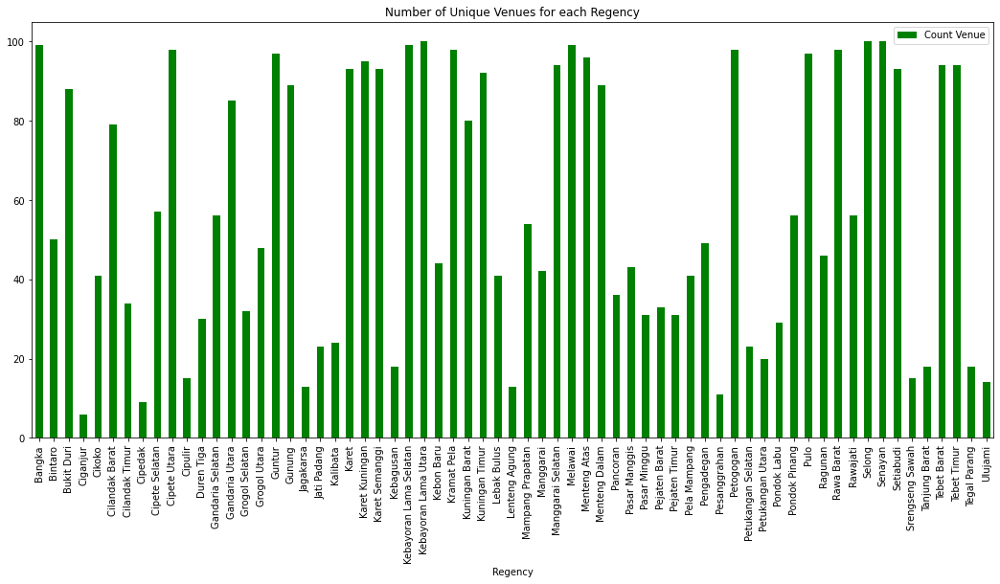

In [26]:
venue_per_Regenc = df_jaksel_explore_venues.groupby('Regency')['Venue'].nunique().reset_index(name='Count Venue')
venue_per_Regenc.plot(kind='bar',x='Regency', y='Count Venue', figsize=(18,8),
                                                    title='Number of Unique Venues for each Regency', color='green');  

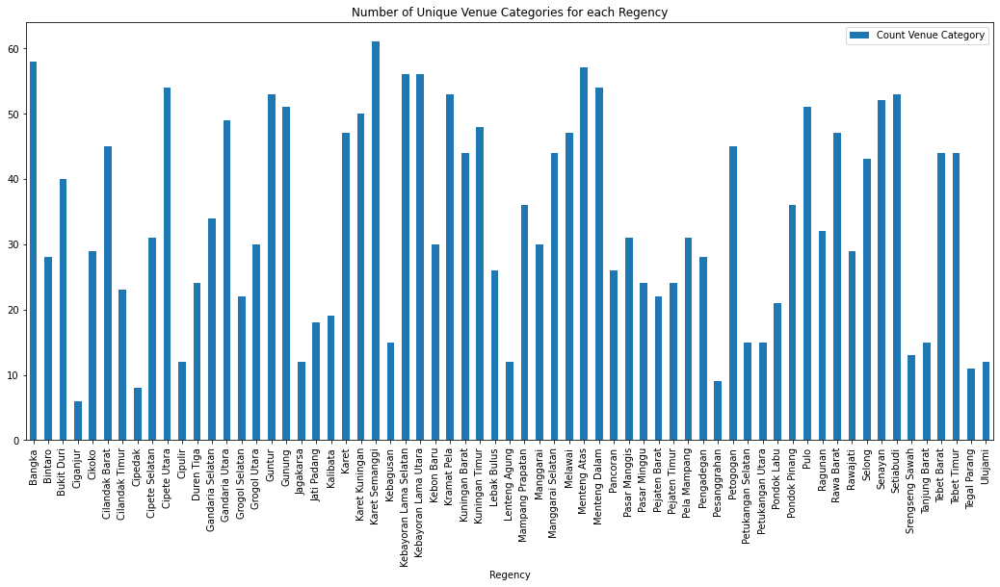

In [27]:
venuecat_per_Regenc = df_jaksel_explore_venues.groupby('Regency')['Venue Category'].nunique().reset_index(name='Count Venue Category')

venuecat_per_Regenc.plot(kind='bar',x='Regency', y='Count Venue Category', figsize=(18,8),
                                                    title='Number of Unique Venue Categories for each Regency');                                                                                                     

In [28]:
explore_venues_onehot = pd.get_dummies(df_jaksel_explore_venues[['Venue Category']], prefix='', prefix_sep='')

# add Regency column back to dataframe
explore_venues_onehot['Regency'] = df_jaksel_explore_venues['Regency'] 

# move Regency column to the first column
fixed_columns = [explore_venues_onehot.columns[-1]] + list(explore_venues_onehot.columns[:-1])
explore_venues_onehot = explore_venues_onehot[fixed_columns]

explore_venues_onehot

,Regency,Acehnese Restaurant,Airport,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,Automotive Shop,BBQ Joint,Bakery,Balinese Restaurant,Bar,Basketball Court,Basketball Stadium,Bed & Breakfast,Beer Bar,Beer Garden,Betawinese Restaurant,Big Box Store,Bistro,Board Shop,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bubble Tea Shop,Buffet,Building,Burger Joint,Bus Line,Butcher,Cafeteria,Café,Camera Store,Campground,Car Wash,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,College Communications Building,College Residence Hall,College Stadium,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Dentist's Office,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Electronics Store,Event Space,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gas Station,Gastropub,General College & University,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hardware Store,Health & Beauty Service,High School,History Museum,Hobby Shop,Hookah Bar,Hospital,Hot Dog Joint,Hotel,Hotel Bar,Housing Development,Ice Cream Shop,Indian Restaurant,Indonesian Meatball Place,Indonesian Restaurant,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Javanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Laundry Service,Library,Lingerie Store,Lounge,Malay Restaurant,Manadonese Restaurant,Market,Martial Arts School,Massage Studio,Medical Center,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Mosque,Motel,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Neighborhood,Nightclub,Noodle House,Office,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Padangnese Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pizza Place,Playground,Plaza,Pool,Pool Hall,Pub,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Residential Building (Apartment / Condo),Restaurant,Rock Club,Salad Place,Salon / Barbershop,Sandwich Place,Satay Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Repair,Shoe Store,Shopping Mall,Skate Park,Smoke Shop,Snack Place,Soba Restaurant,Soccer Field,Soccer Stadium,Soup Place,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Street Food Gathering,Student Center,Sundanese Restaurant,Supermarket,Sushi Restaurant,Tailor Shop,Tea Room,Tech Startup,Thai Restaurant,Theater,Theme Park,Theme Restaurant,Toy / Game Store,Track,Train Station,Travel Agency,Turkish Restaurant,Udon Restaurant,University,Vape Store,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio
0,Cilandak Barat,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Cilandak Barat,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [29]:
# let's group rows by Regency and by taking the mean of the frequency of occurrence of each category
explore_venues_grouped = explore_venues_onehot.groupby('Regency').mean().reset_index()
explore_venues_grouped

,Regency,Acehnese Restaurant,Airport,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,Automotive Shop,BBQ Joint,Bakery,Balinese Restaurant,Bar,Basketball Court,Basketball Stadium,Bed & Breakfast,Beer Bar,Beer Garden,Betawinese Restaurant,Big Box Store,Bistro,Board Shop,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bubble Tea Shop,Buffet,Building,Burger Joint,Bus Line,Butcher,Cafeteria,Café,Camera Store,Campground,Car Wash,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,College Communications Building,College Residence Hall,College Stadium,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Dentist's Office,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Electronics Store,Event Space,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gas Station,Gastropub,General College & University,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hardware Store,Health & Beauty Service,High School,History Museum,Hobby Shop,Hookah Bar,Hospital,Hot Dog Joint,Hotel,Hotel Bar,Housing Development,Ice Cream Shop,Indian Restaurant,Indonesian Meatball Place,Indonesian Restaurant,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Javanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Laundry Service,Library,Lingerie Store,Lounge,Malay Restaurant,Manadonese Restaurant,Market,Martial Arts School,Massage Studio,Medical Center,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Mosque,Motel,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Neighborhood,Nightclub,Noodle House,Office,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Padangnese Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pizza Place,Playground,Plaza,Pool,Pool Hall,Pub,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Residential Building (Apartment / Condo),Restaurant,Rock Club,Salad Place,Salon / Barbershop,Sandwich Place,Satay Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Repair,Shoe Store,Shopping Mall,Skate Park,Smoke Shop,Snack Place,Soba Restaurant,Soccer Field,Soccer Stadium,Soup Place,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Street Food Gathering,Student Center,Sundanese Restaurant,Supermarket,Sushi Restaurant,Tailor Shop,Tea Room,Tech Startup,Thai Restaurant,Theater,Theme Park,Theme Restaurant,Toy / Game Store,Track,Train Station,Travel Agency,Turkish Restaurant,Udon Restaurant,University,Vape Store,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio
0,Bangka,0.0,0.0,0.03,0.000000,0.000000,0.01,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.010000,0.0,0.01,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.02,0.0,0.02,0.000000,0.0,0.0,0.0,0.01,0.00,0.01,0.010000,0.0,0.0,0.0,0.030000,0.01,0.0,0.000000,0.0,0.030000,0.000000,0.01,0.140000,0.0,0.0,0.0,0.01,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.010000,0.010000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.020000,0.0,0.000000,0.01,0.0,0.01,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.01,0.0,0.0,0.0,0.01,0.0,0.00,0.0,0.000000,0.000000,0.02,0.0,0.0,0.0,0.0,0.0,0.020000,0.01,0.0,0.0,0.000000,0.0,0.00,0.0,0.01,0.000

In [30]:
# Let's print each Regency along with the top 10 most common venues

num_top_venues = 10

for subdis in explore_venues_grouped['Regency']:
    print("----"+subdis+"----")
    temp = explore_venues_grouped[explore_venues_grouped['Regency'] == subdis].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Bangka----
                   venue  freq
0            Coffee Shop  0.14
1            Pizza Place  0.05
2             Restaurant  0.05
3     Chinese Restaurant  0.03
4    American Restaurant  0.03
5     Italian Restaurant  0.03
6                   Café  0.03
7  Indonesian Restaurant  0.02
8              Multiplex  0.02
9              Bookstore  0.02


----Bintaro----
                   venue  freq
0             Food Truck  0.09
1            Coffee Shop  0.09
2      Convenience Store  0.09
3  Indonesian Restaurant  0.09
4                    Gym  0.07
5   Fast Food Restaurant  0.07
6             Restaurant  0.05
7       Asian Restaurant  0.05
8             Playground  0.03
9           Burger Joint  0.03


----Bukit Duri----
                       venue  freq
0      Indonesian Restaurant  0.16
1          Convenience Store  0.09
2           Asian Restaurant  0.06
3                       Café  0.05
4                Coffee Shop  0.05
5                     Bakery  0.04
6                 R

In [31]:
# First, let's write a function to sort the venues in descending order.

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [32]:
num_top_venues = 10 # Number of top 5 venues occurence/appearence

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Regency']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
subdistrict_explore_venues_sorted = pd.DataFrame(columns=columns)
subdistrict_explore_venues_sorted['Regency'] = explore_venues_grouped['Regency']

for ind in np.arange(explore_venues_grouped.shape[0]):
    subdistrict_explore_venues_sorted.iloc[ind, 1:] = return_most_common_venues(explore_venues_grouped.iloc[ind, :], num_top_venues)


In [33]:
# Top 5 appearences Venues for each Regency (giving by `explore` endpoint)
subdistrict_explore_venues_sorted

,Regency,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bangka,Coffee Shop,Restaurant,Pizza Place,American Restaurant,Café,Chinese Restaurant,Italian Restaurant,Bookstore,Bistro,Pub
1,Bintaro,Indonesian Restaurant,Food Truck,Coffee Shop,Convenience Store,Gym,Fast Food Restaurant,Restaurant,Asian Restaurant,Café,Salon / Barbershop
2,Bukit Duri,Indonesian Restaurant,Convenience Store,Asian Restaurant,Café,Coffee Shop,Bakery,Restaurant,Indonesian Meatball Place,Karaoke Bar,Clothing Store
3,Ciganjur,Convenience Store,Soccer Stadium,Café,Park,Shopping Mall,Department Store,Yoga Studio,Food & Drink Shop,Furniture / Home Store,Fruit & Vegetable Store
4,Cikoko,Convenience Store,Asian Restaurant,Coffee Shop,Supermarket,Park,Fast Food Restaurant,Café,Noodle House,Art Gallery,Sushi Restaurant
...,...,...,...,...,...,...,...,...,...,...,...
60,Tanjung Barat,Coffee Shop,Javanese Restaurant,Indonesian Restaurant,Fast Food Restaurant,Japanese Restaurant,Hotel,Buffet,Gourmet Shop,Noodle House,Food Court
61,Tebet Barat,Indonesian Restaurant,Convenience Store,Asian Restaurant,Coffee Shop,Café,Bakery,Restaurant,Seafood Restaurant,Karaoke Bar,Art Gallery
62,Tebet Timur,Indonesian Restaurant,Convenience Store,Asian Restaurant,Coffee Shop,Café,Bakery,Restaurant,Seafood Restaurant,Karaoke Bar,Art Gallery
63,Tegal Parang,Food Truck,Asian Restaurant,Coffee Shop,Bakery,Fast Food Restaurant,Movie Theater,Middle Eastern Restaurant,Indonesian Restaurant,Market,Vape Store


# Clustering Regency by Venue Categories

In [34]:
explore_venues_grouped

,Regency,Acehnese Restaurant,Airport,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,Automotive Shop,BBQ Joint,Bakery,Balinese Restaurant,Bar,Basketball Court,Basketball Stadium,Bed & Breakfast,Beer Bar,Beer Garden,Betawinese Restaurant,Big Box Store,Bistro,Board Shop,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bubble Tea Shop,Buffet,Building,Burger Joint,Bus Line,Butcher,Cafeteria,Café,Camera Store,Campground,Car Wash,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,College Communications Building,College Residence Hall,College Stadium,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Dentist's Office,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Electronics Store,Event Space,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gas Station,Gastropub,General College & University,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hardware Store,Health & Beauty Service,High School,History Museum,Hobby Shop,Hookah Bar,Hospital,Hot Dog Joint,Hotel,Hotel Bar,Housing Development,Ice Cream Shop,Indian Restaurant,Indonesian Meatball Place,Indonesian Restaurant,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Javanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Laundry Service,Library,Lingerie Store,Lounge,Malay Restaurant,Manadonese Restaurant,Market,Martial Arts School,Massage Studio,Medical Center,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Mosque,Motel,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Neighborhood,Nightclub,Noodle House,Office,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Padangnese Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pizza Place,Playground,Plaza,Pool,Pool Hall,Pub,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Residential Building (Apartment / Condo),Restaurant,Rock Club,Salad Place,Salon / Barbershop,Sandwich Place,Satay Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Repair,Shoe Store,Shopping Mall,Skate Park,Smoke Shop,Snack Place,Soba Restaurant,Soccer Field,Soccer Stadium,Soup Place,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Street Food Gathering,Student Center,Sundanese Restaurant,Supermarket,Sushi Restaurant,Tailor Shop,Tea Room,Tech Startup,Thai Restaurant,Theater,Theme Park,Theme Restaurant,Toy / Game Store,Track,Train Station,Travel Agency,Turkish Restaurant,Udon Restaurant,University,Vape Store,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio
0,Bangka,0.0,0.0,0.03,0.000000,0.000000,0.01,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.010000,0.0,0.01,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.02,0.0,0.02,0.000000,0.0,0.0,0.0,0.01,0.00,0.01,0.010000,0.0,0.0,0.0,0.030000,0.01,0.0,0.000000,0.0,0.030000,0.000000,0.01,0.140000,0.0,0.0,0.0,0.01,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.010000,0.010000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.020000,0.0,0.000000,0.01,0.0,0.01,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.01,0.0,0.0,0.0,0.01,0.0,0.00,0.0,0.000000,0.000000,0.02,0.0,0.0,0.0,0.0,0.0,0.020000,0.01,0.0,0.0,0.000000,0.0,0.00,0.0,0.01,0.000

## Utilizing Elbow Method for finding the most optimum number of clusters

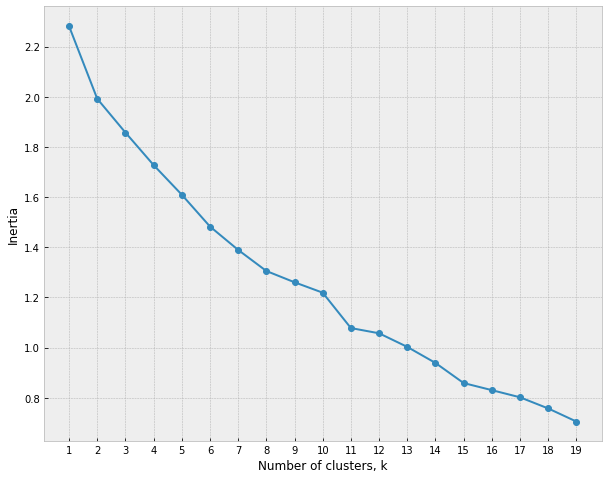

In [35]:
kclusters = range(1,20)
inertias=[]
for k in kclusters:
    model = KMeans(n_clusters=k)
    model.fit(explore_venues_grouped.drop('Regency',1))
    inertias.append(model.inertia_)


plt.figure(figsize=(10,8)) 
plt.style.use('bmh')
plt.plot(kclusters, inertias, '-o')
plt.xlabel('Number of clusters, k')
plt.ylabel('Inertia')
plt.xticks(kclusters)
plt.show()

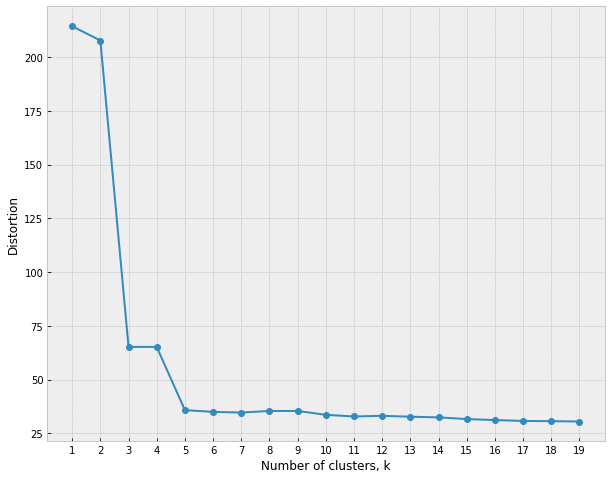

In [36]:
from scipy.spatial.distance import cdist

kclusters = range(1,20)
distortion=[]

for k in kclusters:
    model = KMeans(n_clusters=k, init='k-means++', random_state=0)
    model.fit(explore_venues_grouped.drop('Regency',1))
    distortion.append(sum(np.min(cdist(explore_venues_grouped.drop('Regency',1), 
                                       model.cluster_centers_,'canberra'), axis=1)) / explore_venues_grouped.drop('Regency',1).shape[0])

#There are different metric distance function for spatial distance. 
# `canberra` paramater gives gives more clear view of elbow break point.
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance.cdist.html#scipy.spatial.distance.cdist

plt.figure(figsize=(10,8)) 
plt.style.use('bmh')
plt.plot(kclusters, distortion, '-o')
plt.xlabel('Number of clusters, k')
plt.ylabel('Distortion')
plt.xticks(kclusters)
plt.show()


Based on graphic above, we'll choose 3 as number of clusters

In [37]:
explore_venues_grouped

,Regency,Acehnese Restaurant,Airport,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Dealership,Automotive Shop,BBQ Joint,Bakery,Balinese Restaurant,Bar,Basketball Court,Basketball Stadium,Bed & Breakfast,Beer Bar,Beer Garden,Betawinese Restaurant,Big Box Store,Bistro,Board Shop,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bubble Tea Shop,Buffet,Building,Burger Joint,Bus Line,Butcher,Cafeteria,Café,Camera Store,Campground,Car Wash,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,College Communications Building,College Residence Hall,College Stadium,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Cultural Center,Cupcake Shop,Dance Studio,Deli / Bodega,Dentist's Office,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Electronics Store,Event Space,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Flea Market,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Gas Station,Gastropub,General College & University,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hardware Store,Health & Beauty Service,High School,History Museum,Hobby Shop,Hookah Bar,Hospital,Hot Dog Joint,Hotel,Hotel Bar,Housing Development,Ice Cream Shop,Indian Restaurant,Indonesian Meatball Place,Indonesian Restaurant,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Javanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Laundry Service,Library,Lingerie Store,Lounge,Malay Restaurant,Manadonese Restaurant,Market,Martial Arts School,Massage Studio,Medical Center,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Mosque,Motel,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Neighborhood,Nightclub,Noodle House,Office,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Padangnese Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Café,Pet Service,Pet Store,Pharmacy,Photography Studio,Pie Shop,Pizza Place,Playground,Plaza,Pool,Pool Hall,Pub,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Residential Building (Apartment / Condo),Restaurant,Rock Club,Salad Place,Salon / Barbershop,Sandwich Place,Satay Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Repair,Shoe Store,Shopping Mall,Skate Park,Smoke Shop,Snack Place,Soba Restaurant,Soccer Field,Soccer Stadium,Soup Place,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Street Food Gathering,Student Center,Sundanese Restaurant,Supermarket,Sushi Restaurant,Tailor Shop,Tea Room,Tech Startup,Thai Restaurant,Theater,Theme Park,Theme Restaurant,Toy / Game Store,Track,Train Station,Travel Agency,Turkish Restaurant,Udon Restaurant,University,Vape Store,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yoga Studio
0,Bangka,0.0,0.0,0.03,0.000000,0.000000,0.01,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.010000,0.0,0.01,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.02,0.0,0.02,0.000000,0.0,0.0,0.0,0.01,0.00,0.01,0.010000,0.0,0.0,0.0,0.030000,0.01,0.0,0.000000,0.0,0.030000,0.000000,0.01,0.140000,0.0,0.0,0.0,0.01,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.010000,0.010000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.020000,0.0,0.000000,0.01,0.0,0.01,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.01,0.0,0.0,0.0,0.01,0.0,0.00,0.0,0.000000,0.000000,0.02,0.0,0.0,0.0,0.0,0.0,0.020000,0.01,0.0,0.0,0.000000,0.0,0.00,0.0,0.01,0.000

In [38]:
# set number of clusters
kclusters = 3

explore_venues_grouped_clustering = explore_venues_grouped.drop('Regency', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(explore_venues_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([1, 0, 1, 2, 0, 1, 1, 0, 1, 1, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 2],
      dtype=int32)

In [39]:
# Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

# add clustering labels
subdistrict_explore_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

In [40]:
jaksel_cluster_explore_venues = df_jaksel

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
jaksel_cluster_explore_venues = jaksel_cluster_explore_venues.join(subdistrict_explore_venues_sorted.set_index('Regency'), on='Regency')

jaksel_cluster_explore_venues # check the last columns!

,District,Regency,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Cilandak,Cilandak Barat,-6.290266,106.796215,1,Indonesian Restaurant,Coffee Shop,Asian Restaurant,Café,Gym,Chinese Restaurant,Food Truck,Convenience Store,German Restaurant,Noodle House
1,Cilandak,Cipete Selatan,-6.272540,106.805768,1,Coffee Shop,Café,Food Truck,Indonesian Restaurant,Convenience Store,Noodle House,Fast Food Restaurant,Bakery,Padangnese Restaurant,Motorcycle Shop
2,Cilandak,Gandaria Selatan,-6.271562,106.795172,0,Food Truck,Indonesian Restaurant,Convenience Store,Coffee Shop,Furniture / Home Store,Fast Food Restaurant,Bakery,Motorcycle Shop,Padangnese Restaurant,Music Venue
3,Cilandak,Lebak Bulus,-6.302568,106.780354,1,Indonesian Restaurant,Asian Restaurant,Convenience Store,Seafood Restaurant,Café,Restaurant,Soup Place,Chinese Restaurant,Sushi Restaurant,Supermarket
4,Cilandak,Pondok Labu,-6.309144,106.797938,1,Coffee Shop,Grocery Store,Indonesian Restaurant,Movie Theater,Café,High School,Music School,Bubble Tea Shop,Shopping Mall,Steakhouse
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,Tebet,Manggarai Selatan,-6.226016,106.858396,1,Indonesian Restaurant,Convenience Store,Asian Restaurant,Coffee Shop,Café,Bakery,Restaurant,Seafood Restaurant,Karaoke Bar,Art Gallery
61,Tebet,Manggarai,-6.210134,106.850058,0,Coffee Shop,Fast Food Restaurant,Food Truck,Park,Pizza Place,Arcade,Asian Restaurant,Betawinese Restaurant,Indonesian Meatball Place,Music Venue
62,Tebet,Menteng Dalam,-6.232051,106.840997,1,Indonesian Restaurant,Convenience Store,Coffee Shop,Café,Hotel,Restaurant,Japanese Restaurant,Food Truck,Clothing Store,Sushi Restaurant
63,Tebet,Tebet Barat,-6.226016,106.858396,1,Indonesian Restaurant,Convenience Store,Asian Restaurant,Coffee Shop,Café,Bakery,Restaurant,Seafood Restaurant,Karaoke Bar,Art Gallery


In [41]:
print(jaksel_cluster_explore_venues.shape)

(65, 15)


In [42]:
jaksel_cluster_explore_venues.isnull().sum()

District                  0
Regency                   0
Latitude                  0
Longitude                 0
Cluster Labels            0
1st Most Common Venue     0
2nd Most Common Venue     0
3rd Most Common Venue     0
4th Most Common Venue     0
5th Most Common Venue     0
6th Most Common Venue     0
7th Most Common Venue     0
8th Most Common Venue     0
9th Most Common Venue     0
10th Most Common Venue    0
dtype: int64

In [43]:
# Fisualize clusters

# create map
map_clusters = folium.Map(location=[latitude_jaksel, longitude_jaksel], zoom_start=12)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(jaksel_cluster_explore_venues['Latitude'], jaksel_cluster_explore_venues['Longitude'], 
                                  jaksel_cluster_explore_venues['Regency'], jaksel_cluster_explore_venues['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## Examin Clusters

In [44]:
[c for c in rainbow]

['#8000ff', '#80ffb4', '#ff0000']

In [45]:
# CLuster 0
# Purple '#8000ff'
jaksel_cluster_explore_venues[jaksel_cluster_explore_venues['Cluster Labels']==0].iloc[:,[1,5,6,7,8,9]]

,Regency,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
2,Gandaria Selatan,Food Truck,Indonesian Restaurant,Convenience Store,Coffee Shop,Furniture / Home Store
6,Cipedak,Grocery Store,Department Store,Food Truck,Burger Joint,Bakery
8,Lenteng Agung,Fast Food Restaurant,Acehnese Restaurant,Train Station,Record Shop,Convenience Store
9,Srengseng Sawah,Fast Food Restaurant,Indonesian Restaurant,Seafood Restaurant,College Residence Hall,Steakhouse
31,Tegal Parang,Food Truck,Asian Restaurant,Coffee Shop,Bakery,Fast Food Restaurant
32,Cikoko,Convenience Store,Asian Restaurant,Coffee Shop,Supermarket,Park
33,Duren Tiga,Convenience Store,Restaurant,Food Truck,Clothing Store,Music Venue
35,Pancoran,Food Truck,Convenience Store,Indonesian Restaurant,Asian Restaurant,Steakhouse
36,Pengadegan,Coffee Shop,Convenience Store,Fast Food Restaurant,Asian Restaurant,Pizza Place
41,Pasar Minggu,Convenience Store,Fast Food Restaurant,Asian Restaurant,Food Truck,Noodle House


In [46]:
# CLuster 1
# Blue '#00b5eb'
jaksel_cluster_explore_venues[jaksel_cluster_explore_venues['Cluster Labels']==1].iloc[:,[1,5,6,7,8,9]]

,Regency,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Cilandak Barat,Indonesian Restaurant,Coffee Shop,Asian Restaurant,Café,Gym
1,Cipete Selatan,Coffee Shop,Café,Food Truck,Indonesian Restaurant,Convenience Store
3,Lebak Bulus,Indonesian Restaurant,Asian Restaurant,Convenience Store,Seafood Restaurant,Café
4,Pondok Labu,Coffee Shop,Grocery Store,Indonesian Restaurant,Movie Theater,Café
7,Jagakarsa,Asian Restaurant,Acehnese Restaurant,Soup Place,Pharmacy,Convenience Store
10,Tanjung Barat,Coffee Shop,Javanese Restaurant,Indonesian Restaurant,Fast Food Restaurant,Japanese Restaurant
11,Cipete Utara,Coffee Shop,Hotel,Food Truck,BBQ Joint,Indonesian Restaurant
12,Gandaria Utara,Café,Indonesian Restaurant,Coffee Shop,Food Truck,Japanese Restaurant
13,Gunung,Coffee Shop,Convenience Store,Indonesian Restaurant,Food Truck,Café
14,Kramat Pela,Japanese Restaurant,Coffee Shop,Food Truck,Indonesian Restaurant,Sushi Restaurant


In [47]:
# CLuster 2
# Green '#80ffb4'
jaksel_cluster_explore_venues[jaksel_cluster_explore_venues['Cluster Labels']==2].iloc[:,[1,5,6,7,8,9]]

,Regency,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
5,Ciganjur,Convenience Store,Soccer Stadium,Café,Park,Shopping Mall
21,Cipulir,Department Store,Asian Restaurant,Hobby Shop,Restaurant,Convenience Store
49,Ulujami,Department Store,Convenience Store,Burger Joint,Music Venue,Noodle House


In [48]:
# CLuster 3
# Orange '#ffb360'
jaksel_cluster_explore_venues[jaksel_cluster_explore_venues['Cluster Labels']==3].iloc[:,[1,5,6,7,8,9]]

,Regency,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue


In [49]:
# CLuster 4
# Red '#ff0000'
jaksel_cluster_explore_venues[jaksel_cluster_explore_venues['Cluster Labels']==4].iloc[:,[1,5,6,7,8,9]]

,Regency,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue


## 1st Most Common Venues Analysis

In [50]:
jaksel_cluster_explore_venues

,District,Regency,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Cilandak,Cilandak Barat,-6.290266,106.796215,1,Indonesian Restaurant,Coffee Shop,Asian Restaurant,Café,Gym,Chinese Restaurant,Food Truck,Convenience Store,German Restaurant,Noodle House
1,Cilandak,Cipete Selatan,-6.272540,106.805768,1,Coffee Shop,Café,Food Truck,Indonesian Restaurant,Convenience Store,Noodle House,Fast Food Restaurant,Bakery,Padangnese Restaurant,Motorcycle Shop
2,Cilandak,Gandaria Selatan,-6.271562,106.795172,0,Food Truck,Indonesian Restaurant,Convenience Store,Coffee Shop,Furniture / Home Store,Fast Food Restaurant,Bakery,Motorcycle Shop,Padangnese Restaurant,Music Venue
3,Cilandak,Lebak Bulus,-6.302568,106.780354,1,Indonesian Restaurant,Asian Restaurant,Convenience Store,Seafood Restaurant,Café,Restaurant,Soup Place,Chinese Restaurant,Sushi Restaurant,Supermarket
4,Cilandak,Pondok Labu,-6.309144,106.797938,1,Coffee Shop,Grocery Store,Indonesian Restaurant,Movie Theater,Café,High School,Music School,Bubble Tea Shop,Shopping Mall,Steakhouse
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,Tebet,Manggarai Selatan,-6.226016,106.858396,1,Indonesian Restaurant,Convenience Store,Asian Restaurant,Coffee Shop,Café,Bakery,Restaurant,Seafood Restaurant,Karaoke Bar,Art Gallery
61,Tebet,Manggarai,-6.210134,106.850058,0,Coffee Shop,Fast Food Restaurant,Food Truck,Park,Pizza Place,Arcade,Asian Restaurant,Betawinese Restaurant,Indonesian Meatball Place,Music Venue
62,Tebet,Menteng Dalam,-6.232051,106.840997,1,Indonesian Restaurant,Convenience Store,Coffee Shop,Café,Hotel,Restaurant,Japanese Restaurant,Food Truck,Clothing Store,Sushi Restaurant
63,Tebet,Tebet Barat,-6.226016,106.858396,1,Indonesian Restaurant,Convenience Store,Asian Restaurant,Coffee Shop,Café,Bakery,Restaurant,Seafood Restaurant,Karaoke Bar,Art Gallery


In [51]:
df_cluster = jaksel_cluster_explore_venues.drop(['District', 'Regency', 'Latitude', 'Longitude'],axis=1)
df_cluster.head()

,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,1,Indonesian Restaurant,Coffee Shop,Asian Restaurant,Café,Gym,Chinese Restaurant,Food Truck,Convenience Store,German Restaurant,Noodle House
1,1,Coffee Shop,Café,Food Truck,Indonesian Restaurant,Convenience Store,Noodle House,Fast Food Restaurant,Bakery,Padangnese Restaurant,Motorcycle Shop
2,0,Food Truck,Indonesian Restaurant,Convenience Store,Coffee Shop,Furniture / Home Store,Fast Food Restaurant,Bakery,Motorcycle Shop,Padangnese Restaurant,Music Venue
3,1,Indonesian Restaurant,Asian Restaurant,Convenience Store,Seafood Restaurant,Café,Restaurant,Soup Place,Chinese Restaurant,Sushi Restaurant,Supermarket
4,1,Coffee Shop,Grocery Store,Indonesian Restaurant,Movie Theater,Café,High School,Music School,Bubble Tea Shop,Shopping Mall,Steakhouse


In [52]:
count_venue = df_cluster.groupby(['Cluster Labels', '1st Most Common Venue']).size().reset_index(name='Count Venue')
count_venue

,Cluster Labels,1st Most Common Venue,Count Venue
0,0,Asian Restaurant,1
1,0,Coffee Shop,3
2,0,Convenience Store,7
3,0,Fast Food Restaurant,3
4,0,Food Truck,3
5,0,Grocery Store,1
6,0,Indonesian Restaurant,1
7,0,Pizza Place,1
8,1,Asian Restaurant,1
9,1,Café,1


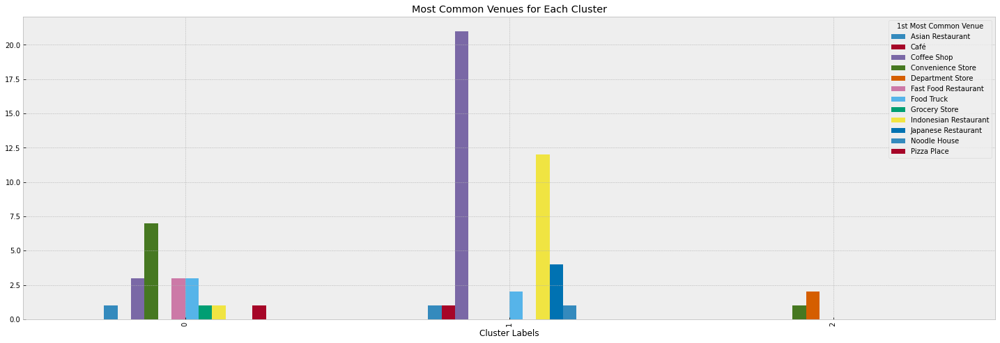

In [53]:
count_venue.pivot(index='Cluster Labels',columns='1st Most Common Venue', values='Count Venue').fillna(0).astype('int').plot(kind='bar', figsize=(25,8),
                                                                                                                             title='Most Common Venues for Each Cluster');

In [54]:
# top 3 venues per Regency

top3 = df_jaksel_explore_venues.groupby(['Regency', 'Venue Category'])['Venue'].count().reset_index(name='Counts')
top3 = top3.sort_values(['Regency', 'Counts'], ascending=False).groupby('Regency').head(3).reset_index(drop=True)

top3['Join'] = top3['Counts'].map(str) + " " + top3['Venue Category']
top3

,Regency,Venue Category,Counts,Join
0,Ulujami,Convenience Store,2,2 Convenience Store
1,Ulujami,Department Store,2,2 Department Store
2,Ulujami,Asian Restaurant,1,1 Asian Restaurant
3,Tegal Parang,Asian Restaurant,3,3 Asian Restaurant
4,Tegal Parang,Food Truck,3,3 Food Truck
...,...,...,...,...
190,Bintaro,Convenience Store,5,5 Convenience Store
191,Bintaro,Food Truck,5,5 Food Truck
192,Bangka,Coffee Shop,14,14 Coffee Shop
193,Bangka,Pizza Place,5,5 Pizza Place


In [55]:
top3 = top3.groupby(['Regency'])['Join'].apply(", ".join).reset_index()

top3

,Regency,Join
0,Bangka,"14 Coffee Shop, 5 Pizza Place, 5 Restaurant"
1,Bintaro,"5 Coffee Shop, 5 Convenience Store, 5 Food Truck"
2,Bukit Duri,"15 Indonesian Restaurant, 9 Convenience Store,..."
3,Ciganjur,"1 Café, 1 Convenience Store, 1 Department Store"
4,Cikoko,"7 Convenience Store, 3 Asian Restaurant, 3 Cof..."
...,...,...
60,Tanjung Barat,"3 Coffee Shop, 2 Fast Food Restaurant, 2 Indon..."
61,Tebet Barat,"17 Indonesian Restaurant, 8 Convenience Store,..."
62,Tebet Timur,"17 Indonesian Restaurant, 8 Convenience Store,..."
63,Tegal Parang,"3 Asian Restaurant, 3 Food Truck, 2 Bakery"


In [56]:
df_summary = top3.merge(jaksel_cluster_explore_venues, how='inner', left_on='Regency', right_on='Regency').iloc[:,:6]
df_summary 

,Regency,Join,District,Latitude,Longitude,Cluster Labels
0,Bangka,"14 Coffee Shop, 5 Pizza Place, 5 Restaurant",Mampang Prapatan,-6.264007,106.819292,1
1,Bintaro,"5 Coffee Shop, 5 Convenience Store, 5 Food Truck",Pesanggrahan,-6.271393,106.760862,0
2,Bukit Duri,"15 Indonesian Restaurant, 9 Convenience Store,...",Tebet,-6.220104,106.856599,1
3,Ciganjur,"1 Café, 1 Convenience Store, 1 Department Store",Jagakarsa,-6.333430,106.807537,2
4,Cikoko,"7 Convenience Store, 3 Asian Restaurant, 3 Cof...",Pancoran,-6.245102,106.854456,0
...,...,...,...,...,...,...
60,Tanjung Barat,"3 Coffee Shop, 2 Fast Food Restaurant, 2 Indon...",Jagakarsa,-6.308478,106.838856,1
61,Tebet Barat,"17 Indonesian Restaurant, 8 Convenience Store,...",Tebet,-6.226016,106.858396,1
62,Tebet Timur,"17 Indonesian Restaurant, 8 Convenience Store,...",Tebet,-6.226016,106.858396,1
63,Tegal Parang,"3 Asian Restaurant, 3 Food Truck, 2 Bakery",Mampang Prapatan,-6.249144,106.829488,0


In [57]:
# Shopping Center
df_summary[df_summary['Cluster Labels']==0]

,Regency,Join,District,Latitude,Longitude,Cluster Labels
1,Bintaro,"5 Coffee Shop, 5 Convenience Store, 5 Food Truck",Pesanggrahan,-6.271393,106.760862,0
4,Cikoko,"7 Convenience Store, 3 Asian Restaurant, 3 Cof...",Pancoran,-6.245102,106.854456,0
7,Cipedak,"2 Grocery Store, 1 Bakery, 1 Burger Joint",Jagakarsa,-6.354410,106.802390,0
11,Duren Tiga,"5 Convenience Store, 3 Restaurant, 2 Clothing ...",Pancoran,-6.256131,106.833915,0
12,Gandaria Selatan,"7 Food Truck, 5 Convenience Store, 5 Indonesia...",Cilandak,-6.271562,106.795172,0
27,Kebon Baru,"5 Convenience Store, 3 Asian Restaurant, 3 Fas...",Tebet,-6.234304,106.862492,0
32,Lenteng Agung,"2 Fast Food Restaurant, 1 Acehnese Restaurant,...",Jagakarsa,-6.323263,106.835848,0
34,Manggarai,"5 Coffee Shop, 4 Fast Food Restaurant, 4 Food ...",Tebet,-6.210134,106.850058,0
39,Pancoran,"3 Convenience Store, 3 Food Truck, 2 Asian Res...",Pancoran,-6.258085,106.842733,0
40,Pasar Manggis,"5 Coffee Shop, 4 Fast Food Restaurant, 3 Bakery",Setiabudi,-6.210876,106.842370,0


In [58]:
# Culinary Center
df_summary[df_summary['Cluster Labels']==1]

,Regency,Join,District,Latitude,Longitude,Cluster Labels
0,Bangka,"14 Coffee Shop, 5 Pizza Place, 5 Restaurant",Mampang Prapatan,-6.264007,106.819292,1
2,Bukit Duri,"15 Indonesian Restaurant, 9 Convenience Store,...",Tebet,-6.220104,106.856599,1
5,Cilandak Barat,"6 Asian Restaurant, 6 Coffee Shop, 6 Indonesia...",Cilandak,-6.290266,106.796215,1
6,Cilandak Timur,"6 Coffee Shop, 3 Asian Restaurant, 3 Indonesia...",Pasar Minggu,-6.292077,106.811283,1
8,Cipete Selatan,"9 Coffee Shop, 4 Café, 4 Food Truck",Cilandak,-6.272540,106.805768,1
9,Cipete Utara,"7 Coffee Shop, 5 Food Truck, 5 Hotel",Kebayoran Baru,-6.261009,106.804054,1
13,Gandaria Utara,"7 Café, 7 Indonesian Restaurant, 5 Coffee Shop",Kebayoran Baru,-6.256612,106.790339,1
14,Grogol Selatan,"3 Indonesian Restaurant, 3 Residential Buildin...",Kebayoran Lama,-6.229538,106.780018,1
15,Grogol Utara,"8 Indonesian Restaurant, 3 Breakfast Spot, 3 C...",Kebayoran Lama,-6.216549,106.786665,1
16,Guntur,"10 Coffee Shop, 5 Café, 4 Hotel",Setiabudi,-6.208383,106.833559,1


In [59]:
#Borderland
df_summary[df_summary['Cluster Labels']==2]

,Regency,Join,District,Latitude,Longitude,Cluster Labels
3,Ciganjur,"1 Café, 1 Convenience Store, 1 Department Store",Jagakarsa,-6.333430,106.807537,2
10,Cipulir,"3 Department Store, 2 Asian Restaurant, 1 Bask...",Kebayoran Lama,-6.237899,106.772562,2
64,Ulujami,"2 Convenience Store, 2 Department Store, 1 Asi...",Pesanggrahan,-6.236150,106.763881,2


In [60]:
# Assign Labels 
df_summary['Label'] = df_summary['Cluster Labels'].map({0:'Shopping Center',
                                                        1:'Culinary Center',
                                                        2:'Borderland'})

df_summary.rename(columns={'Join':'Common Venue'}, inplace=True)

In [61]:
df_summary

,Regency,Common Venue,District,Latitude,Longitude,Cluster Labels,Label
0,Bangka,"14 Coffee Shop, 5 Pizza Place, 5 Restaurant",Mampang Prapatan,-6.264007,106.819292,1,Culinary Center
1,Bintaro,"5 Coffee Shop, 5 Convenience Store, 5 Food Truck",Pesanggrahan,-6.271393,106.760862,0,Shopping Center
2,Bukit Duri,"15 Indonesian Restaurant, 9 Convenience Store,...",Tebet,-6.220104,106.856599,1,Culinary Center
3,Ciganjur,"1 Café, 1 Convenience Store, 1 Department Store",Jagakarsa,-6.333430,106.807537,2,Borderland
4,Cikoko,"7 Convenience Store, 3 Asian Restaurant, 3 Cof...",Pancoran,-6.245102,106.854456,0,Shopping Center
...,...,...,...,...,...,...,...
60,Tanjung Barat,"3 Coffee Shop, 2 Fast Food Restaurant, 2 Indon...",Jagakarsa,-6.308478,106.838856,1,Culinary Center
61,Tebet Barat,"17 Indonesian Restaurant, 8 Convenience Store,...",Tebet,-6.226016,106.858396,1,Culinary Center
62,Tebet Timur,"17 Indonesian Restaurant, 8 Convenience Store,...",Tebet,-6.226016,106.858396,1,Culinary Center
63,Tegal Parang,"3 Asian Restaurant, 3 Food Truck, 2 Bakery",Mampang Prapatan,-6.249144,106.829488,0,Shopping Center


# COVID DATA

In [62]:
df_covid = pd.read_csv('https://raw.githubusercontent.com/abdurrahmanshidiq/IBM-Capstone-Project/master/Data_Covid19_Jakarta_November_2020.csv')
df_covid

,id_kel,nama_provinsi,nama_kota,nama_kecamatan,nama_kelurahan,suspek,perawatan_rs,isolasi_di_rumah,suspek_meninggal,selesai_isolasi,probable,perawatan_rs.1,isolasi_di_rumah.1,probable_meninggal,selesai_isolasi.1,pelaku_perjalanan,perawatan_rs.2,isolasi_di_rumah.2,selesai_isolasi.2,kontak_erat,isolasi_di_rumah.3,selesai_isolasi.3,discarded,isolasi_di_rumah.4,meninggal,selesai_isolasi.4,positif,dirawat,sembuh,meninggal.1,self_isolation,keterangan
0,3172051003,DKI JAKARTA,JAKARTA UTARA,PADEMANGAN,ANCOL,618,2,58,0,558,4,0,0,0,4,16,0,3,13,844,72,772,10,0,0,10,385,4,359,4,18,NaN
1,3173041007,DKI JAKARTA,JAKARTA BARAT,TAMBORA,ANGKE,628,5,38,2,583,3,0,0,1,2,1,0,0,1,605,18,587,27,0,0,27,227,0,213,4,10,NaN
2,3175041005,DKI JAKARTA,JAKARTA TIMUR,KRAMAT JATI,BALE KAMBANG,422,1,51,1,369,7,0,0,0,7,5,0,0,5,760,65,695,25,0,0,25,240,5,215,3,17,NaN
3,3175031003,DKI JAKARTA,JAKARTA TIMUR,JATINEGARA,BALI MESTER,156,1,9,1,145,2,0,0,0,2,1,0,0,1,311,83,228,7,0,0,7,211,2,200,3,6,NaN
4,3175101006,DKI JAKARTA,JAKARTA TIMUR,CIPAYUNG,BAMBU APUS,789,2,35,1,751,0,0,0,0,0,5,0,0,5,1099,102,997,20,0,0,20,253,12,223,3,15,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264,3175011006,DKI JAKARTA,JAKARTA TIMUR,MATRAMAN,UTAN KAYU SELATAN,706,13,35,8,650,2,0,0,0,2,8,0,0,8,1408,227,1181,98,0,0,98,396,2,369,9,16,NaN
265,3175011002,DKI JAKARTA,JAKARTA TIMUR,MATRAMAN,UTAN KAYU UTARA,787,5,242,0,540,4,2,0,0,2,6,0,0,6,1213,206,1007,49,0,0,49,338,1,305,14,18,NaN
266,3171031008,DKI JAKARTA,JAKARTA PUSAT,KEMAYORAN,UTAN PANJANG,541,1,44,2,494,0,0,0,0,0,4,0,0,4,782,48,734,31,0,0,31,355,1,332,10,12,NaN
267,3172021007,DKI JAKARTA,JAKARTA UTARA,TANJUNG PRIOK,WARAKAS,860,1,65,2,792,0,0,0,0,0,12,0,0,12,1326,160,1166,70,0,0,70,472,4,441,8,19,NaN


In [63]:
covid_jaksel = df_covid[df_covid['nama_kota']=='JAKARTA SELATAN'][['id_kel', 'nama_kota', 'nama_kecamatan', 
                                                                   'nama_kelurahan', 'positif']].reset_index(drop=True)
covid_jaksel

,id_kel,nama_kota,nama_kecamatan,nama_kelurahan,positif
0,3174031002,JAKARTA SELATAN,MAMPANG PRAPATAN,BANGKA,263
1,3174101002,JAKARTA SELATAN,PESANGGRAHAN,BINTARO,530
2,3174011005,JAKARTA SELATAN,TEBET,BUKIT DURI,297
3,3174091003,JAKARTA SELATAN,JAGAKARSA,CIGANJUR,304
4,3174081006,JAKARTA SELATAN,PANCORAN,CIKOKO,123
...,...,...,...,...,...
60,3174091005,JAKARTA SELATAN,JAGAKARSA,TANJUNG BARAT,388
61,3174011002,JAKARTA SELATAN,TEBET,TEBET BARAT,586
62,3174011001,JAKARTA SELATAN,TEBET,TEBET TIMUR,289
63,3174031004,JAKARTA SELATAN,MAMPANG PRAPATAN,TEGAL PARANG,424


In [64]:
covid_jaksel['nama_kota'] = [string.capwords(r) for r in covid_jaksel['nama_kota']]
covid_jaksel['nama_kecamatan'] = [string.capwords(r) for r in covid_jaksel['nama_kecamatan']]
covid_jaksel['nama_kelurahan'] = [string.capwords(r) for r in covid_jaksel['nama_kelurahan']]

In [65]:
covid_jaksel

,id_kel,nama_kota,nama_kecamatan,nama_kelurahan,positif
0,3174031002,Jakarta Selatan,Mampang Prapatan,Bangka,263
1,3174101002,Jakarta Selatan,Pesanggrahan,Bintaro,530
2,3174011005,Jakarta Selatan,Tebet,Bukit Duri,297
3,3174091003,Jakarta Selatan,Jagakarsa,Ciganjur,304
4,3174081006,Jakarta Selatan,Pancoran,Cikoko,123
...,...,...,...,...,...
60,3174091005,Jakarta Selatan,Jagakarsa,Tanjung Barat,388
61,3174011002,Jakarta Selatan,Tebet,Tebet Barat,586
62,3174011001,Jakarta Selatan,Tebet,Tebet Timur,289
63,3174031004,Jakarta Selatan,Mampang Prapatan,Tegal Parang,424


In [66]:
covid_jaksel['positif'].sum()

20992

In [67]:
# Checking Regency name on `jaksel dataframe` & `covid dataframe`
kelurahan_a = df_jaksel['Regency'].sort_values().unique()
kelurahan_b = covid_jaksel['nama_kelurahan'].sort_values().unique()
for b in kelurahan_b:
  if b not in kelurahan_a:
    print(b)

Rawa Jati
Setia Budi


In [68]:
covid_jaksel[covid_jaksel['nama_kelurahan']=='Setia Budi']

,id_kel,nama_kota,nama_kecamatan,nama_kelurahan,positif
58,3174021001,Jakarta Selatan,Setia Budi,Setia Budi,74


In [69]:
# Fixing the name of Regency
covid_jaksel.iloc[55,3] = 'Rawajati'
covid_jaksel.iloc[58,3] = 'Setiabudi'

In [70]:
df_covid_jaksel = df_jaksel.merge(covid_jaksel, left_on='Regency', right_on='nama_kelurahan')    

df_covid_jaksel = df_covid_jaksel[['District','Regency','Latitude','Longitude','positif']]
df_covid_jaksel

,District,Regency,Latitude,Longitude,positif
0,Cilandak,Cilandak Barat,-6.290266,106.796215,675
1,Cilandak,Cipete Selatan,-6.272540,106.805768,247
2,Cilandak,Gandaria Selatan,-6.271562,106.795172,230
3,Cilandak,Lebak Bulus,-6.302568,106.780354,576
4,Cilandak,Pondok Labu,-6.309144,106.797938,359
...,...,...,...,...,...
60,Tebet,Manggarai Selatan,-6.226016,106.858396,234
61,Tebet,Manggarai,-6.210134,106.850058,332
62,Tebet,Menteng Dalam,-6.232051,106.840997,384
63,Tebet,Tebet Barat,-6.226016,106.858396,586


In [71]:
df_covid_jaksel.columns = ['District','Regency','Latitude','Longitude','Positive Case']
df_covid_jaksel

,District,Regency,Latitude,Longitude,Positive Case
0,Cilandak,Cilandak Barat,-6.290266,106.796215,675
1,Cilandak,Cipete Selatan,-6.272540,106.805768,247
2,Cilandak,Gandaria Selatan,-6.271562,106.795172,230
3,Cilandak,Lebak Bulus,-6.302568,106.780354,576
4,Cilandak,Pondok Labu,-6.309144,106.797938,359
...,...,...,...,...,...
60,Tebet,Manggarai Selatan,-6.226016,106.858396,234
61,Tebet,Manggarai,-6.210134,106.850058,332
62,Tebet,Menteng Dalam,-6.232051,106.840997,384
63,Tebet,Tebet Barat,-6.226016,106.858396,586


# Geo Json Jakarta Selatan

In [72]:
geojson_jaksel = r'https://raw.githubusercontent.com/abdurrahmanshidiq/IBM-Capstone-Project/master/id-jk-jaksel.geojson'

In [73]:
x = pd.read_json(geojson_jaksel)
y = [i['properties']['name'] for i in x['features']]
y.sort()
y

['Cilandak',
 'Jagakarsa',
 'Kebayoran Baru',
 'Kebayoran Lama',
 'Mampang Prapatan',
 'Pancoran',
 'Pasar Minggu',
 'Pesanggrahan',
 'Setiabudi',
 'Tebet']

## Visualize Covid Case per District & Subdistrict-Cluster

In [74]:
jaksel_cluster_explore_venues[jaksel_cluster_explore_venues['Regency']=='Cilandak Barat']

,District,Regency,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Cilandak,Cilandak Barat,-6.290266,106.796215,1,Indonesian Restaurant,Coffee Shop,Asian Restaurant,Café,Gym,Chinese Restaurant,Food Truck,Convenience Store,German Restaurant,Noodle House


In [75]:
jaksel_map = folium.Map([latitude_jaksel, longitude_jaksel], zoom_start=12)



jaksel_map.choropleth(geo_data=geojson_jaksel,
                      data=df_covid_jaksel,
                      columns=['District','Positive Case'],
                      key_on='feature.properties.name',
                      fill_color='YlOrRd', 
                      fill_opacity=0.7, 
                      line_opacity=0.2,
                      legend_name='Covid Case',
                      highlight=True)

for lat, lon, d, sd, cluster in zip(jaksel_cluster_explore_venues['Latitude'], jaksel_cluster_explore_venues['Longitude'], jaksel_cluster_explore_venues['District'],
                                  jaksel_cluster_explore_venues['Regency'], jaksel_cluster_explore_venues['Cluster Labels']):
    label = folium.Popup('{},{}\n\n Cluster {}'.format(d,sd,cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(jaksel_map)

jaksel_map

/usr/local/lib/python3.7/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [76]:
df_summary.head(10)

,Regency,Common Venue,District,Latitude,Longitude,Cluster Labels,Label
0,Bangka,"14 Coffee Shop, 5 Pizza Place, 5 Restaurant",Mampang Prapatan,-6.264007,106.819292,1,Culinary Center
1,Bintaro,"5 Coffee Shop, 5 Convenience Store, 5 Food Truck",Pesanggrahan,-6.271393,106.760862,0,Shopping Center
2,Bukit Duri,"15 Indonesian Restaurant, 9 Convenience Store,...",Tebet,-6.220104,106.856599,1,Culinary Center
3,Ciganjur,"1 Café, 1 Convenience Store, 1 Department Store",Jagakarsa,-6.333430,106.807537,2,Borderland
4,Cikoko,"7 Convenience Store, 3 Asian Restaurant, 3 Cof...",Pancoran,-6.245102,106.854456,0,Shopping Center
5,Cilandak Barat,"6 Asian Restaurant, 6 Coffee Shop, 6 Indonesia...",Cilandak,-6.290266,106.796215,1,Culinary Center
6,Cilandak Timur,"6 Coffee Shop, 3 Asian Restaurant, 3 Indonesia...",Pasar Minggu,-6.292077,106.811283,1,Culinary Center
7,Cipedak,"2 Grocery Store, 1 Bakery, 1 Burger Joint",Jagakarsa,-6.354410,106.802390,0,Shopping Center
8,Cipete Selatan,"9 Coffee Shop, 4 Café, 4 Food Truck",Cilandak,-6.272540,106.805768,1,Culinary Center
9,Cipete Utara,"7 Coffee Shop, 5 Food Truck, 5 Hotel",Kebayoran Baru,-6.261009,106.804054,1,Culinary Center


In [77]:
jaksel_map = folium.Map([latitude_jaksel, longitude_jaksel], zoom_start=12)



jaksel_map.choropleth(geo_data=geojson_jaksel,
                      data=df_covid_jaksel,
                      columns=['District','Positive Case'],
                      key_on='feature.properties.name',
                      fill_color='YlOrRd', 
                      fill_opacity=0.5, 
                      line_opacity=0.2,
                      legend_name='COVID-19 Positive Case',
                      highlight=True,)

for lat, lon, d, sd, cluster, l, cm in zip(df_summary['Latitude'], df_summary['Longitude'], df_summary['District'],
                                  df_summary['Regency'], df_summary['Cluster Labels'], df_summary['Label'], df_summary['Common Venue']):
    label = folium.Popup('{},{}\n\n | Cluster {}\n\n | {}\n\n | Common Venues : {}'.format(d,sd,cluster,l,cm), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(jaksel_map)

jaksel_map

/usr/local/lib/python3.7/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning
